# **Frontier Technologies Learning Collaborative​**
## **Week 3: Classification**

### **Question: What kind of data more suitable for a classification task?**

**A)** Quantative Data

**B)** Continuous Data

**C)** Categorical Data

Answer: C

### **Question: Which of the visual represent the Sigmoid Function? (A, B, C)**

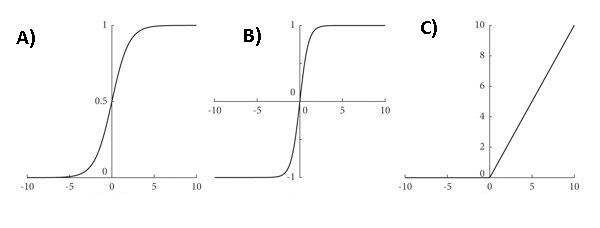

Answer: A

### **Question: Please write sigmoid function that receives a value and returns the output after sigmoid function calculation**

**The sigmoid function:**

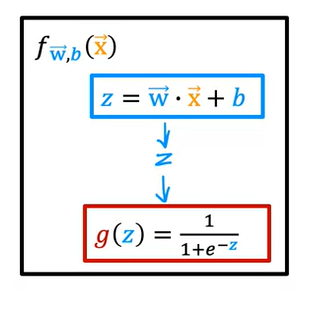

In [1]:
import numpy as np
def sigmoid(z):
  # formula
  g_z = 1 / (1 + np.exp(-z))
  return g_z

### **Question: Please visualize given sample dataset**

Expected output(please do not consider the colors or the theme of the sample visuals, main purpose is to visualize data points):



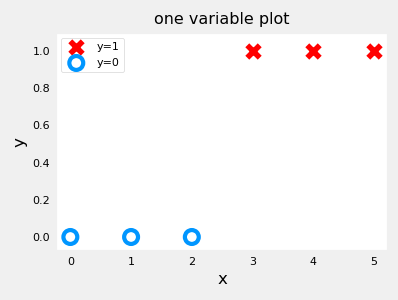

In [2]:
import numpy as np

In [3]:
x_train = np.array([0., 1, 2, 3, 4, 5])
y_train = np.array([0,  0, 0, 1, 1, 1])

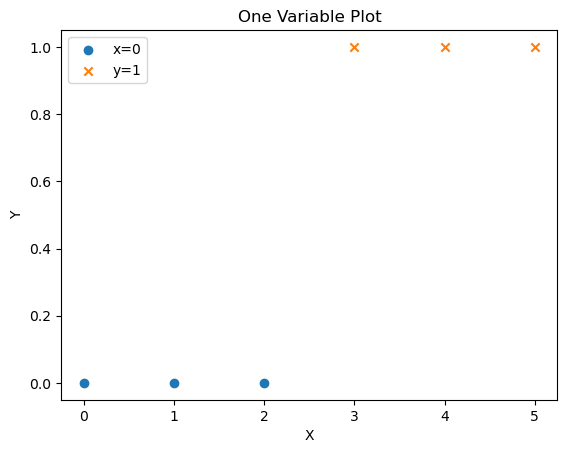

In [4]:
import matplotlib.pyplot as plt

plt.scatter(x_train[:3], y_train[:3], marker='o', label='x=0')
plt.scatter(x_train[3:], y_train[3:], marker='x', label='y=1')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('One Variable Plot')
plt.legend()
plt.show()

## **Classification Task: Finding smokers by body signals**

### **The dataset**

This dataset is a collection of basic health biological signal data.
The goal is to determine the presence or absence of smoking through bio-signals.

**Data shape: (55692, 27)**

*   **ID:** index
*   **gender**
*   **age:** 5-years gap
*   **height(cm)**
*   **weight(kg)**
*   **waist(cm):** Waist circumference length
*   **eyesight(left)**
*   **eyesight(right)**
*   **hearing(left)**
*   **hearing(right)**
*   **systolic:** Blood pressure
*   **relaxation:** Blood pressure
*   **fasting blood sugar**
*   **Cholesterol: **total
*   **triglyceride**
*   **HDL:** cholesterol type
*   **LDL:** cholesterol type
*   **hemoglobin**
*   **Urine protein**
*   **serum creatinine**
*   **AST:** glutamic oxaloacetic transaminase type
*   **ALT:** glutamic oxaloacetic transaminase type
*   **Gtp:** γ-GTP
*   **oral:** Oral Examination status
*   **dental caries**
*   **tartar:** tartar status
*   **smoking**

### **1. Import required packages**

In [5]:
import pandas as pd

### **2. Import dataset**

In [6]:
df = pd.read_csv('/content/smoking.csv')
df.head()

,ID,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,...,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,...,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,...,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,...,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,...,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0


### **3. Explore dataset**

*   Info
*   Shape
*   Do  visualization on features, (i.e. gender distribution on a pie chart, or histograms on other kind of features)
*   Identify valuable features for ML training (observe correlations between smokers and not smokers based on the features)
*   Preapre the dataset for ML model (converting categorical values to numerical variables - labelencoding)

In [7]:
# Get information about the dataset
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55692 entries, 0 to 55691
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   55692 non-null  int64  
 1   gender               55692 non-null  object 
 2   age                  55692 non-null  int64  
 3   height(cm)           55692 non-null  int64  
 4   weight(kg)           55692 non-null  int64  
 5   waist(cm)            55692 non-null  float64
 6   eyesight(left)       55692 non-null  float64
 7   eyesight(right)      55692 non-null  float64
 8   hearing(left)        55692 non-null  float64
 9   hearing(right)       55692 non-null  float64
 10  systolic             55692 non-null  float64
 11  relaxation           55692 non-null  float64
 12  fasting blood sugar  55692 non-null  float64
 13  Cholesterol          55692 non-null  float64
 14  triglyceride         55692 non-null  float64
 15  HDL                  55692 non-null 

In [8]:
print(df.shape)


(55692, 27)


In [9]:
print(df.columns)

Index(['ID', 'gender', 'age', 'height(cm)', 'weight(kg)', 'waist(cm)',
       'eyesight(left)', 'eyesight(right)', 'hearing(left)', 'hearing(right)',
       'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol',
       'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein',
       'serum creatinine', 'AST', 'ALT', 'Gtp', 'oral', 'dental caries',
       'tartar', 'smoking'],
      dtype='object')


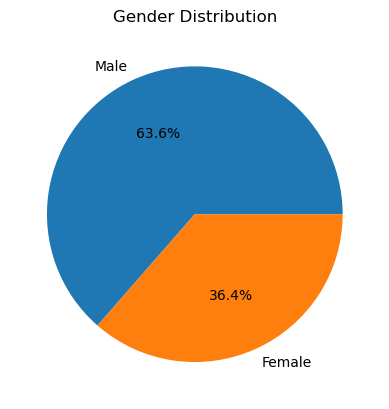

In [10]:
#gender distribution on a pie chart

# Count the number of males and females
gender_counts = df['gender'].value_counts()
gender_counts

# pie chart
plt.pie(gender_counts, labels=['Male', 'Female'], autopct='%1.1f%%')
plt.title('Gender Distribution')
plt.show()

It suggests that the dataset may have some gender bias, with a higher representation of males than females. This could potentially impact the model's performance, particularly if there are significant gender-related differences in the health outcomes being predicted. 

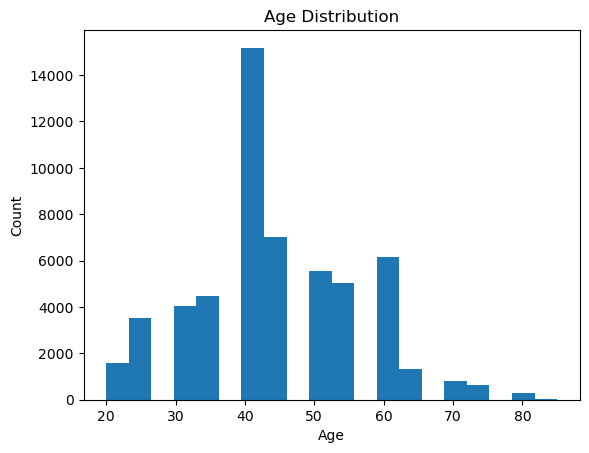

In [11]:
#histogram of age
plt.hist(df['age'], bins=20)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Age Distribution')
plt.show()

It is interesting to see that there are higher numbers of people in the age range of 40-46. This could be due to a variety of factors such as increased health concerns or screenings for people in that age range. The lower numbers of people after age 65 could be due to factors such as mortality or lower participation in the study among older individuals.

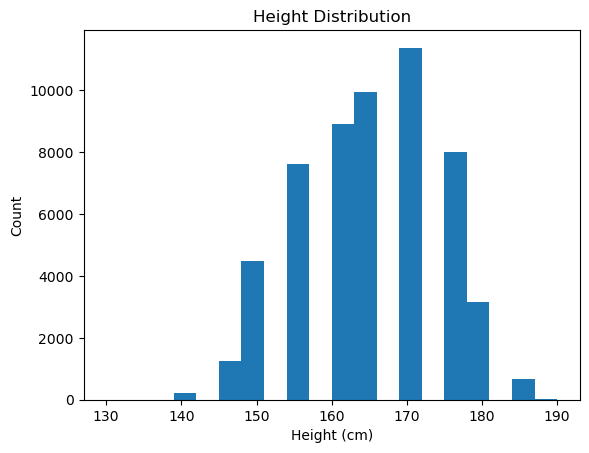

In [12]:
# histogram of height
plt.hist(df['height(cm)'], bins=20)
plt.xlabel('Height (cm)')
plt.ylabel('Count')
plt.title('Height Distribution')
plt.show()

The height distribution appears to be roughly bell-shaped, with the majority of people falling between 150 cm and 170 cm, and very few above 190 cm.

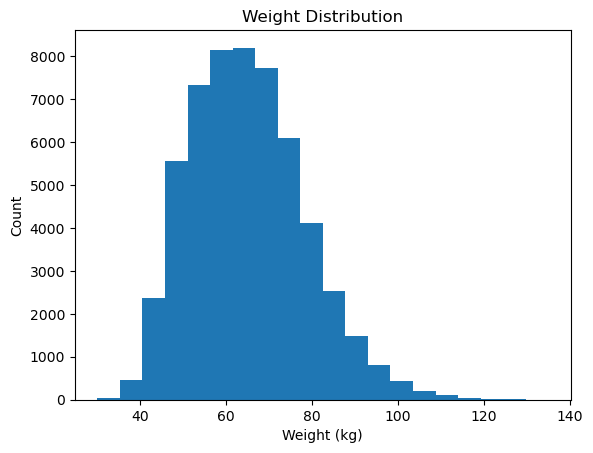

In [13]:
# histogram of weight
plt.hist(df['weight(kg)'], bins=20)
plt.xlabel('Weight (kg)')
plt.ylabel('Count')
plt.title('Weight Distribution')
plt.show()

It seems that there is a higher frequency of lower weights, and then the frequency gradually decreases as the weight increases. This is a typical pattern of a right-skewed distribution.

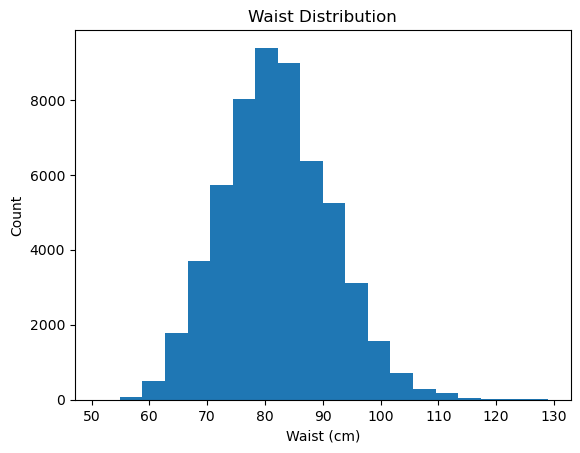

In [14]:
# histogram of waist
plt.hist(df['waist(cm)'], bins=20)
plt.xlabel('Waist (cm)')
plt.ylabel('Count')
plt.title('Waist Distribution')
plt.show()

 The waist distribution appears to be approximately normally distributed with the peak around 78-82 cm and the tails extending towards larger and smaller values.

Checking Unique values for Eyesight Left and Right.

In [15]:
unique_left_eyesight = df['eyesight(left)'].unique()
unique_right_eyesight = df['eyesight(right)'].unique()

print("Unique values in 'eyesight(left)':", unique_left_eyesight)
print("Unique values in 'eyesight(right)':", unique_right_eyesight)


Unique values in 'eyesight(left)': [1.2 0.8 1.5 1.  0.7 0.9 0.3 0.2 0.1 0.6 0.4 0.5 2.  9.9 1.3 1.6 1.9 1.1
 1.8]
Unique values in 'eyesight(right)': [1.  0.6 0.8 1.5 1.2 0.7 0.4 0.9 0.3 0.1 0.5 2.  9.9 0.2 1.3 1.6 1.1]


In [16]:
import plotly.express as px
# interactive scatter plot for eyesight(left) and eyesight(right
fig = px.scatter(df, x='eyesight(left)', y='eyesight(right)', color='gender', hover_name='ID')
fig.update_layout(title='Eyesight Distribution', xaxis_title='Eyesight (Left)', yaxis_title='Eyesight (Right)')
fig.show()

The majority of the data points are concentrated around the values of 0-2 for both eyes. Since the majority of the data points are overlapping in the same range for both eyes, it may indicate that there is a strong correlation between the eyesight of both eyes.

In [17]:
left_hearing_counts = df['hearing(left)'].value_counts()
right_hearing_counts = df['hearing(right)'].value_counts()

print("Unique values and their counts in 'hearing(left)':\n", left_hearing_counts)
print("\nUnique values and their counts in 'hearing(right)':\n", right_hearing_counts)


Unique values and their counts in 'hearing(left)':
 1.0    54267
2.0     1425
Name: hearing(left), dtype: int64

Unique values and their counts in 'hearing(right)':
 1.0    54236
2.0     1456
Name: hearing(right), dtype: int64


In [18]:
# Count unique values in hearing(left) and hearing(right) columns
left_counts = df['hearing(left)'].value_counts()
right_counts = df['hearing(right)'].value_counts()

# Create bar chart for hearing(left)
fig_left = px.bar(x=left_counts.index, y=left_counts.values, labels={'x': 'Hearing (left)'}, title='Count of unique values in Hearing (left) column')

# Create bar chart for hearing(right)
fig_right = px.bar(x=right_counts.index, y=right_counts.values, labels={'x': 'Hearing (right)'}, title='Count of unique values in Hearing (right) column')

# Display the plots
fig_left.show()
fig_right.show()


It seems like there is not much variation between the values of hearing(left) and hearing(right). Most of the values are 1, with only around 1500 rows having a value of 2 for both features. This suggests that the hearing abilities of the left and right ear are generally similar for the individuals in the dataset.

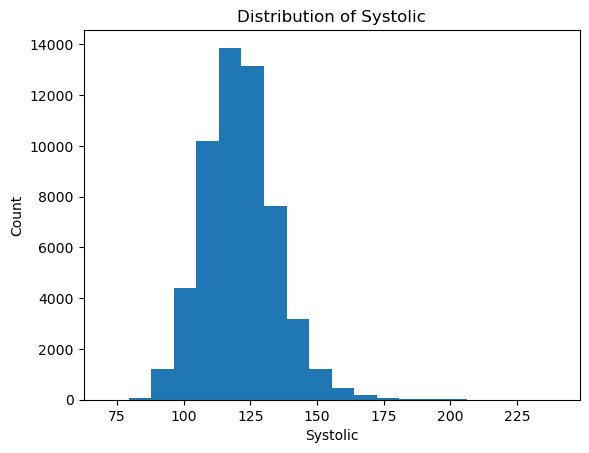

In [19]:
# Systolic Histogram
plt.hist(df['systolic'], bins=20)
plt.xlabel('Systolic')
plt.ylabel('Count')
plt.title('Distribution of Systolic')
plt.show()


The Systolic column has values starting from 50 to 140. Most of the values are from 70-90. It is also slightly right skewed.

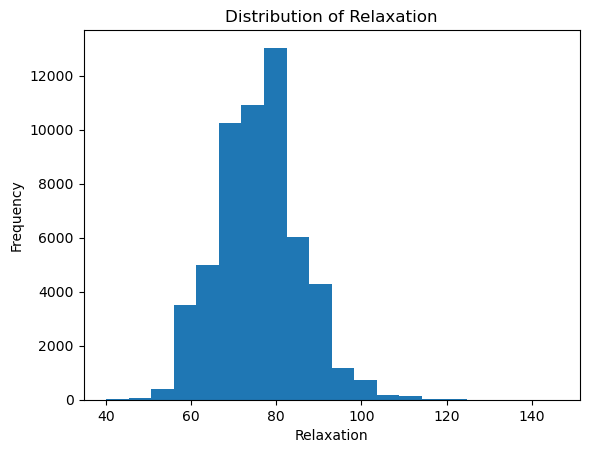

In [20]:
# histogram of the 'relaxation' column
plt.hist(df['relaxation'], bins=20)

# Add x and y labels
plt.xlabel('Relaxation')
plt.ylabel('Frequency')

# Add a title to the plot
plt.title('Distribution of Relaxation')

# Show the plot
plt.show()


 Based on your description, the distribution of values in this column appears to be a bit left skewed, with most of the values centered around 75-85.

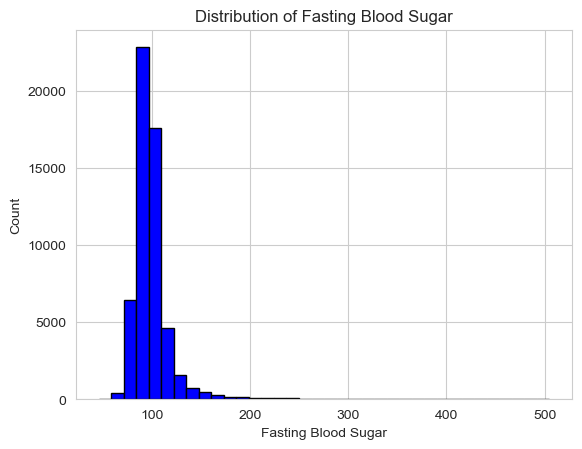

In [21]:
import seaborn as sns

# Set style
sns.set_style("whitegrid")

# histogram of 'fasting blood sugar'
plt.hist(df['fasting blood sugar'], color = 'blue', edgecolor = 'black',
         bins = int(180/5))

# Add labels
plt.title('Distribution of Fasting Blood Sugar')
plt.xlabel('Fasting Blood Sugar')
plt.ylabel('Count')

# Show the plot
plt.show()


The distribution of Fasting Blood Sugar values appears to be slightly right-skewed, with most of the values falling between 90-110.

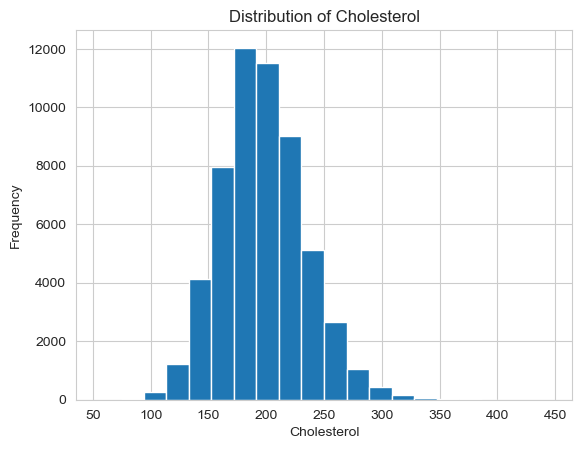

In [22]:
# Plot histogram of 'Cholesterol'
plt.hist(df['Cholesterol'], bins=20)
plt.xlabel('Cholesterol')
plt.ylabel('Frequency')
plt.title('Distribution of Cholesterol')
plt.show()

The distribution of cholesterol seems to be approximately normal with a mean around 190-210

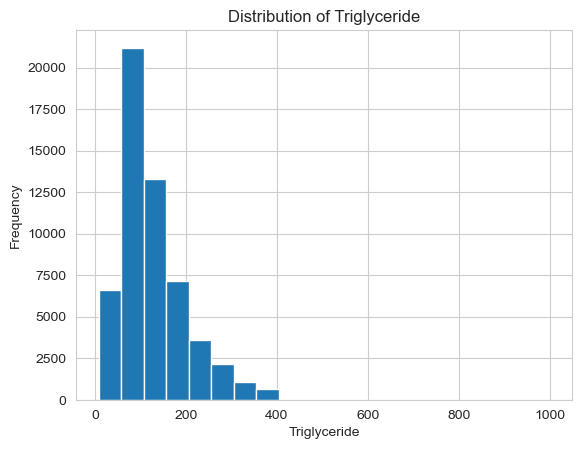

In [23]:
# Plot histogram
plt.hist(df['triglyceride'], bins=20)
plt.title('Distribution of Triglyceride')
plt.xlabel('Triglyceride')
plt.ylabel('Frequency')
plt.show()

Triglyceride is typically from 30 to 150, with most values around 70-80. The distribution is right-skewed, with a long tail towards higher values.

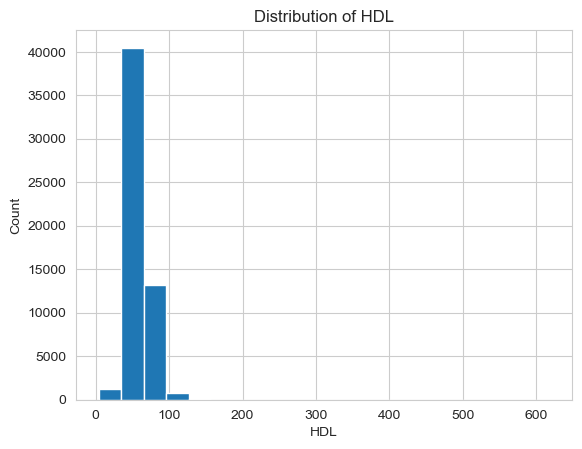

In [24]:
plt.hist(df['HDL'], bins=20)
plt.xlabel('HDL')
plt.ylabel('Count')
plt.title('Distribution of HDL')
plt.show()

It seems like the distribution of HDL cholesterol values is slightly skewed to the right, with most values falling between 50-70 and a smaller proportion of values between 80-100. There are also a few values above 100 and very few values between 100-120.

In [25]:
fig = px.histogram(df, x="LDL", nbins=20, title="Distribution of LDL")
fig.show()


It's important to note that LDL levels above 190 mg/dL are considered high and may increase the risk of heart disease. It's possible that the values near 500, 1000, and 1500 could be true outliers and should be investigated further.

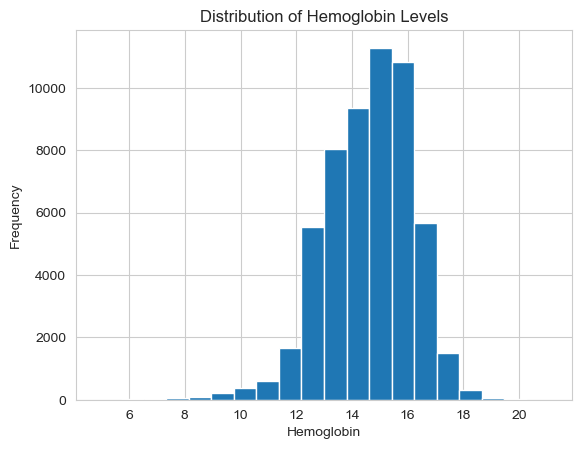

In [26]:
plt.hist(df['hemoglobin'], bins=20)
plt.xlabel('Hemoglobin')
plt.ylabel('Frequency')
plt.title('Distribution of Hemoglobin Levels')
plt.show()

In this dataset, the distribution of hemoglobin values is left-skewed, meaning that there are more observations with higher values than with lower values. The distribution starts at 6.8 and goes up to 19.0, with the majority of values falling between 14 and 16. This suggests that most people in the dataset have normal hemoglobin levels, which is typically between 12 and 16 for women and 13.5 to 17.5 for men.

In [27]:
fig = px.histogram(df, x="Urine protein", nbins=20)
fig.show()

It seems like the distribution of urine protein is heavily skewed towards the value of 1, with the majority (98%) of the values falling within this category. The remaining values are much less common, with values of 2 and 3 being the most prevalent among the minority of observations that fall outside of the value of 1. Values of 4, 5, and 6 are even less common, with only a small number of observations falling into these categories.

In [28]:
print(df['serum creatinine'].unique())

[ 0.7  0.6  1.   1.2  1.3  0.8  1.1  0.9  0.5  0.4  1.5  1.4  1.6  1.8
  0.1  3.   1.9 10.3  5.   1.7  2.   3.3  0.3  7.5  7.4  2.6  2.5  0.2
  9.9  2.2  2.1  6.4  3.2  3.4 11.6  2.3  5.9 10. ]


<AxesSubplot: xlabel='serum creatinine', ylabel='Count'>

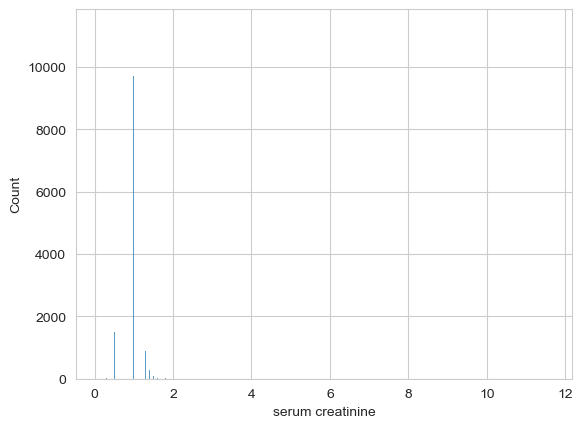

In [29]:
sns.histplot(df['serum creatinine'], kde=False)

It seems like the distribution of serum creatinine starts from 0.5 and has a maximum frequency around 1.0.

In [30]:
fig = px.histogram(df, x="AST", nbins=20, title="Distribution of AST")
fig.show()

It seems like the distribution of AST is skewed to the right. Most of the values are between 0-99

In [31]:
fig = px.histogram(df, x='ALT', nbins=20, title="Distribution of ALT")
fig.show()

It seems like the distribution of ALT is skewed to the right. Most of the values are between 0-199

In [32]:
fig = px.histogram(df, x="Gtp", nbins=50, title="Distribution of Gtp")
fig.show()

It seems like the distribution of GTP is right skewed. Most of the values are between 0-39

In [33]:
fig = px.histogram(data_frame=df, x="oral", color="smoking")
fig.update_layout(title="Distribution of Oral Examination Status by Smoking Status")
fig.show()


Out of the total number of Oral Examination provider in the dataset, 36.7% are smokers and 63.3% are non-smokers.

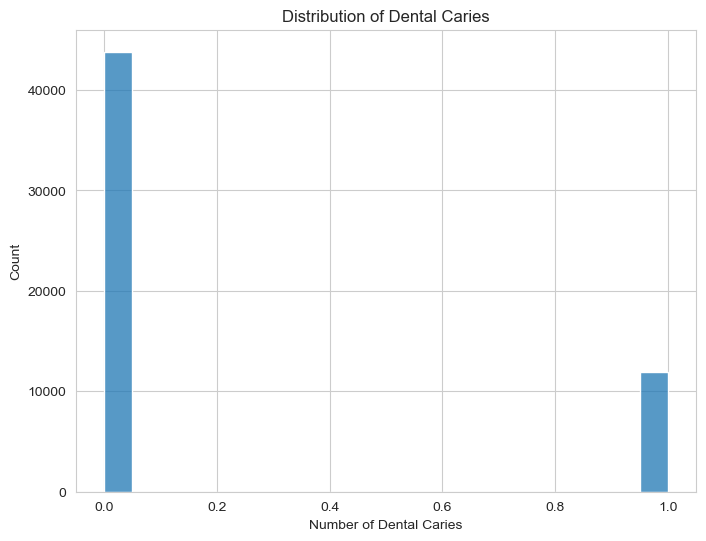

In [34]:
# plot distribution of 'dental caries'
plt.figure(figsize=(8,6))
sns.histplot(data=df, x='dental caries', bins=20)
plt.title('Distribution of Dental Caries')
plt.xlabel('Number of Dental Caries')
plt.ylabel('Count')
plt.show()

Based on the Dental Caries distribution in the dataset, it can be inferred that approximately 43,000 individuals do not have Dental Caries while around 12,000 individuals have Dental Caries.

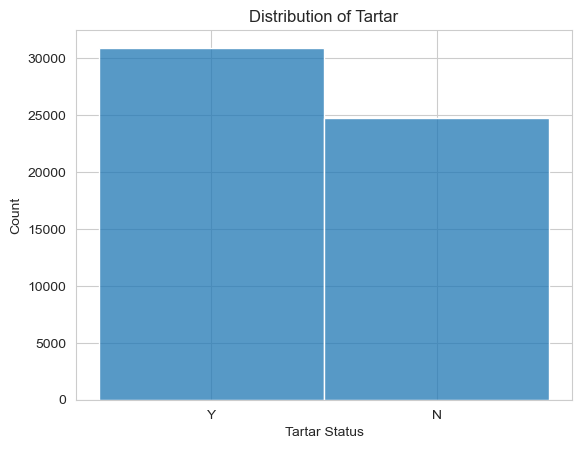

In [35]:
sns.histplot(data=df, x='tartar')
plt.title('Distribution of Tartar')
plt.xlabel('Tartar Status')
plt.ylabel('Count')
plt.show()

The distribution of Tartar in the dataset suggests that approximately 32,000 individuals have Tartar while around 24,000 individuals do not have Tartar.

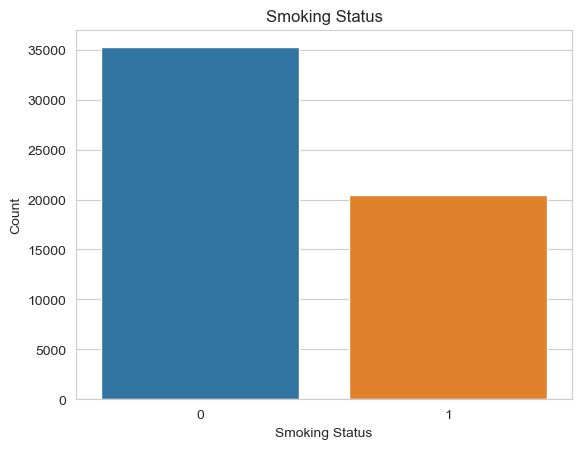

In [36]:
sns.countplot(x='smoking', data=df)
plt.title('Smoking Status')
plt.xlabel('Smoking Status')
plt.ylabel('Count')
plt.show()


In [37]:
# calculate the correlation coefficients
correlations = df.corr(numeric_only=True)['smoking']

# print the correlation coefficients
print(correlations)

ID                     0.011476
age                   -0.162557
height(cm)             0.396675
weight(kg)             0.302780
waist(cm)              0.226259
eyesight(left)         0.061204
eyesight(right)        0.063017
hearing(left)         -0.023209
hearing(right)        -0.018855
systolic               0.073109
relaxation             0.108309
fasting blood sugar    0.100279
Cholesterol           -0.028548
triglyceride           0.251799
HDL                   -0.178470
LDL                   -0.045220
hemoglobin             0.400678
Urine protein          0.014267
serum creatinine       0.216812
AST                    0.059253
ALT                    0.097338
Gtp                    0.236619
dental caries          0.103857
smoking                1.000000
Name: smoking, dtype: float64


Checking unique values of some observed columns

In [38]:
# Specify the columns to get unique values and their counts
columns = ['hearing(left)', 'hearing(right)', 'gender', 'oral', 'dental caries', 'tartar', 'smoking', 'Urine protein']

# Print unique values and their counts for each column
for col in columns:
    print(df[col].value_counts())

1.0    54267
2.0     1425
Name: hearing(left), dtype: int64
1.0    54236
2.0     1456
Name: hearing(right), dtype: int64
M    35401
F    20291
Name: gender, dtype: int64
Y    55692
Name: oral, dtype: int64
0    43811
1    11881
Name: dental caries, dtype: int64
Y    30940
N    24752
Name: tartar, dtype: int64
0    35237
1    20455
Name: smoking, dtype: int64
1.0    52599
2.0     1795
3.0      940
4.0      260
5.0       88
6.0       10
Name: Urine protein, dtype: int64


'hearing(left)', 'hearing(right)',  'dental caries' , 'smoking' are actually categorical, just encoded as Numerical

## 
'gender', 'tartar' are categorical, not encoded yet.

##
'oral' column has only one unique value.

## 
'Urine protein' is an ordinal feature with 6 points

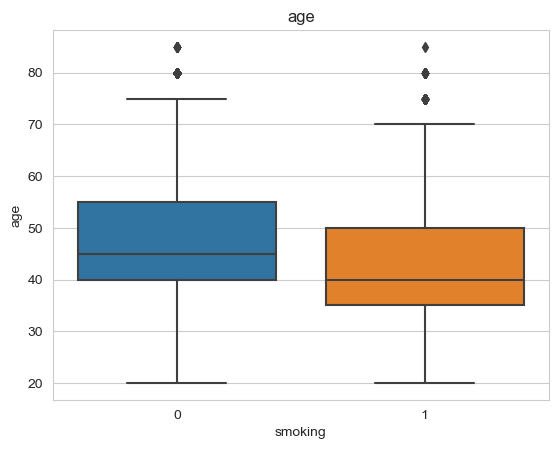

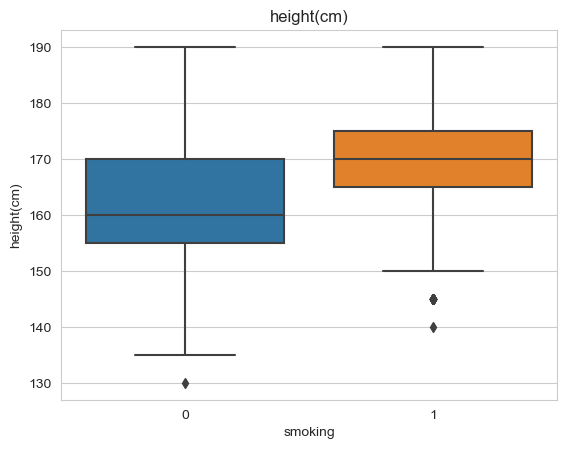

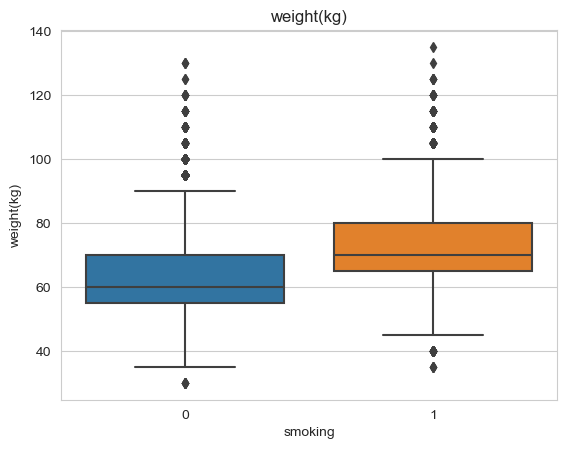

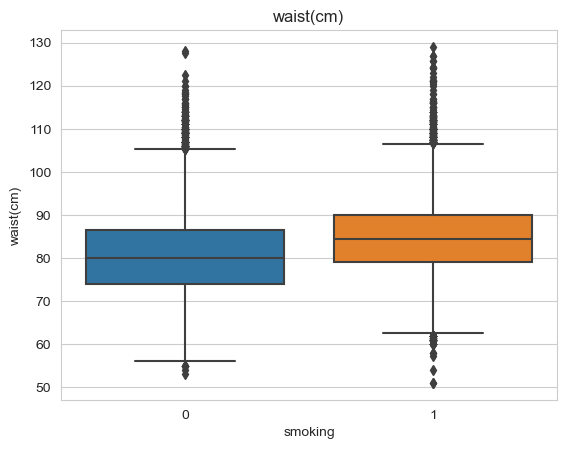

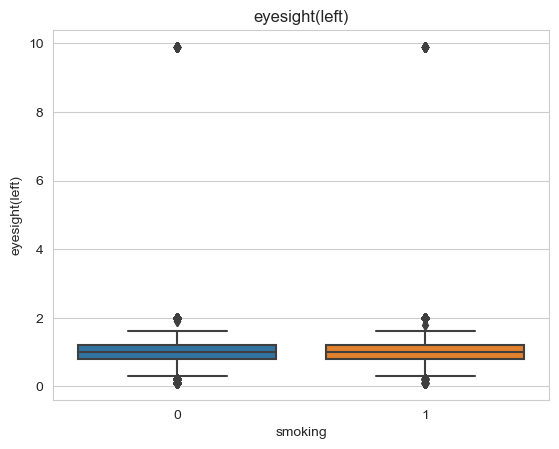

...

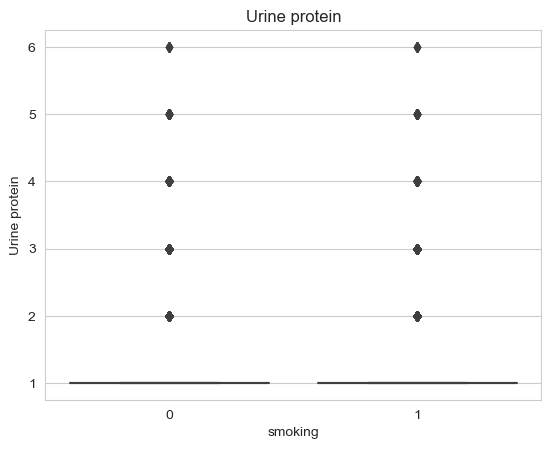

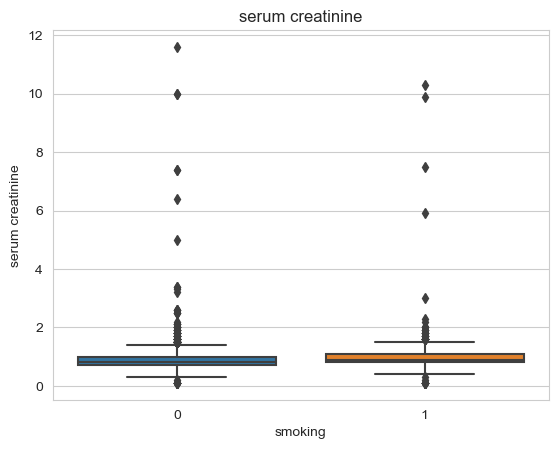

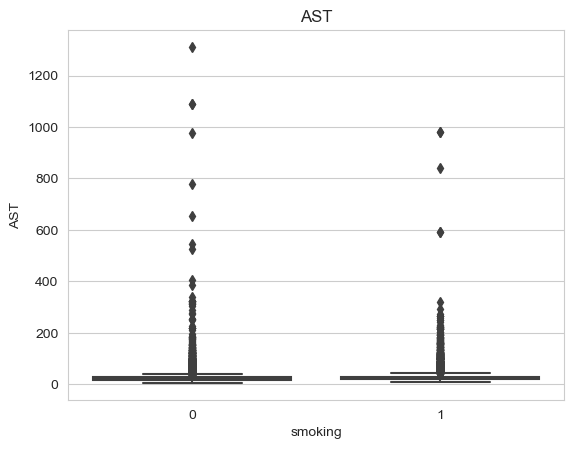

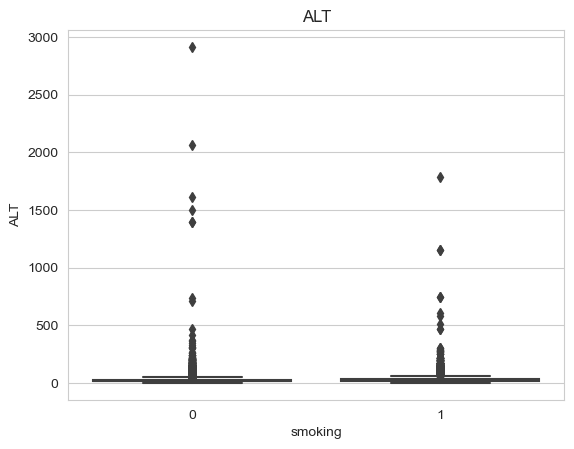

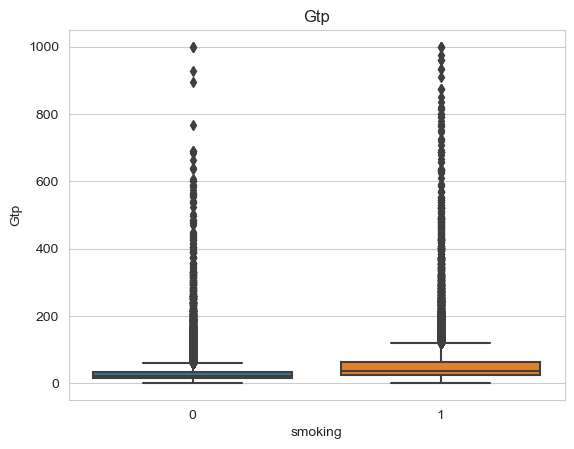

In [39]:
# The purpose of this code is to subset the numerical features from the given dataset, group them by smoking status, 
# and then plot boxplots for each numerical feature to compare their distribution between smokers and non-smokers. 
# This code can help identify any potential differences in health indicators between smokers and non-smokers.

# Subset the numerical features only
numerical_cols = ['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 
                   'systolic', 'relaxation', 'fasting blood sugar',
                  'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein',
                  'serum creatinine', 'AST', 'ALT', 'Gtp']

# Group by smoking and plot boxplots for each numerical feature
for col in numerical_cols:
    plt.figure()
    sns.boxplot(x='smoking', y=col, data=df)
    plt.title(col)

In [40]:
df.head().T

,0,1,2,3,4
ID,0,1,2,3,4
gender,F,F,M,M,F
age,40,40,55,40,40
height(cm),155,160,170,165,155
weight(kg),60,60,60,70,60
waist(cm),81.3,81.0,80.0,88.0,86.0
eyesight(left),1.2,0.8,0.8,1.5,1.0
eyesight(right),1.0,0.6,0.8,1.5,1.0
hearing(left),1.0,1.0,1.0,1.0,1.0
hearing(right),1.0,1.0,1.0,1.0,1.0


Dropping unnecessary Columns fro the DF

The ID column is not essential for the analysis. Moreover, the oral column has only one unique value, which implies that it has no impact on the final outcome of the data being present or absent.

In [41]:
df = df.drop(['ID', 'oral'], axis=1)
df.head().T

,0,1,2,3,4
gender,F,F,M,M,F
age,40,40,55,40,40
height(cm),155,160,170,165,155
weight(kg),60,60,60,70,60
waist(cm),81.3,81.0,80.0,88.0,86.0
eyesight(left),1.2,0.8,0.8,1.5,1.0
eyesight(right),1.0,0.6,0.8,1.5,1.0
hearing(left),1.0,1.0,1.0,1.0,1.0
hearing(right),1.0,1.0,1.0,1.0,1.0
systolic,114.0,119.0,138.0,100.0,120.0


In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55692 entries, 0 to 55691
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   gender               55692 non-null  object 
 1   age                  55692 non-null  int64  
 2   height(cm)           55692 non-null  int64  
 3   weight(kg)           55692 non-null  int64  
 4   waist(cm)            55692 non-null  float64
 5   eyesight(left)       55692 non-null  float64
 6   eyesight(right)      55692 non-null  float64
 7   hearing(left)        55692 non-null  float64
 8   hearing(right)       55692 non-null  float64
 9   systolic             55692 non-null  float64
 10  relaxation           55692 non-null  float64
 11  fasting blood sugar  55692 non-null  float64
 12  Cholesterol          55692 non-null  float64
 13  triglyceride         55692 non-null  float64
 14  HDL                  55692 non-null  float64
 15  LDL                  55692 non-null 

The purpose of this code is to calculate the correlation coefficients between the 'smoking' variable and all other numerical variables in the dataframe 'df', and print the results.

In [43]:
# calculate the correlation coefficients
correlations = df.corr(numeric_only=True)['smoking']

# print the correlation coefficients
print(correlations)

age                   -0.162557
height(cm)             0.396675
weight(kg)             0.302780
waist(cm)              0.226259
eyesight(left)         0.061204
eyesight(right)        0.063017
hearing(left)         -0.023209
hearing(right)        -0.018855
systolic               0.073109
relaxation             0.108309
fasting blood sugar    0.100279
Cholesterol           -0.028548
triglyceride           0.251799
HDL                   -0.178470
LDL                   -0.045220
hemoglobin             0.400678
Urine protein          0.014267
serum creatinine       0.216812
AST                    0.059253
ALT                    0.097338
Gtp                    0.236619
dental caries          0.103857
smoking                1.000000
Name: smoking, dtype: float64


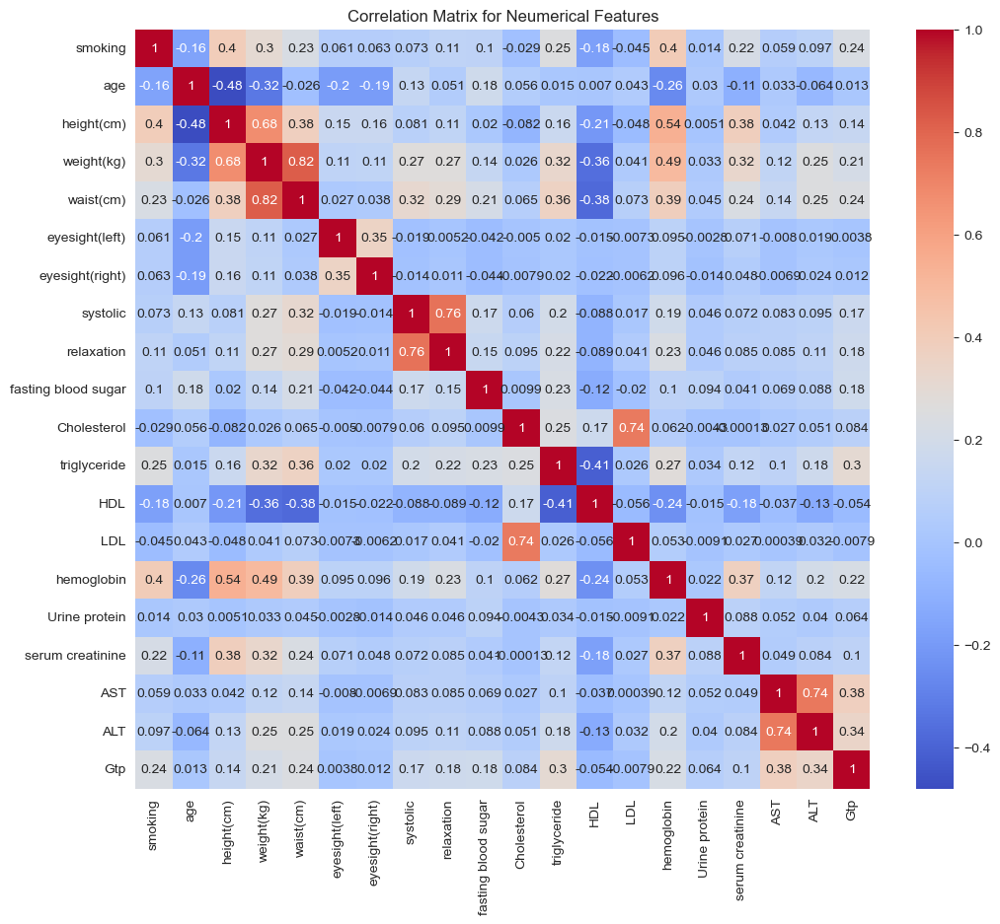

In [44]:
# Compute pairwise correlation of numerical columns with smoking
corr_df = df[['smoking', 'age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 
                  'systolic', 'relaxation', 'fasting blood sugar',
                  'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein',
                  'serum creatinine', 'AST', 'ALT', 'Gtp']].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(12,10))
sns.heatmap(corr_df, annot=True, cmap="coolwarm")
plt.title('Correlation Matrix for Neumerical Features')
plt.show()

The purpose of the code is to create count plots to visualize the relationship between smoking and various categorical features in the dataset such as gender, tartar, hearing (left and right), and dental caries. Before creating the count plots, the code converts the hearing (left), hearing (right), and dental caries columns to categorical variables. The count plots show the distribution of smoking status for each category of the categorical features, which can help identify any potential relationships or patterns between smoking and these variables.

Text(0.5, 1.0, 'Dental Caries vs Smoking')

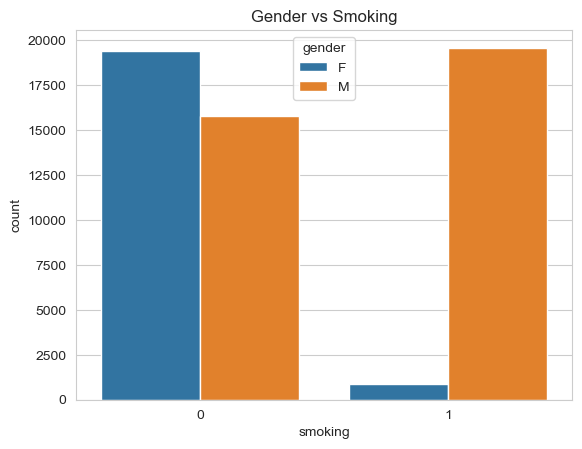

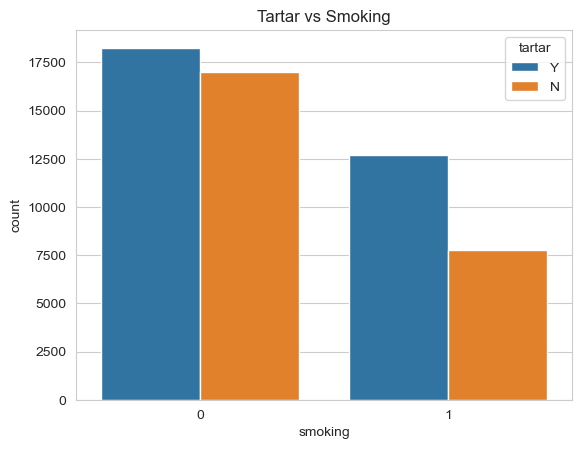

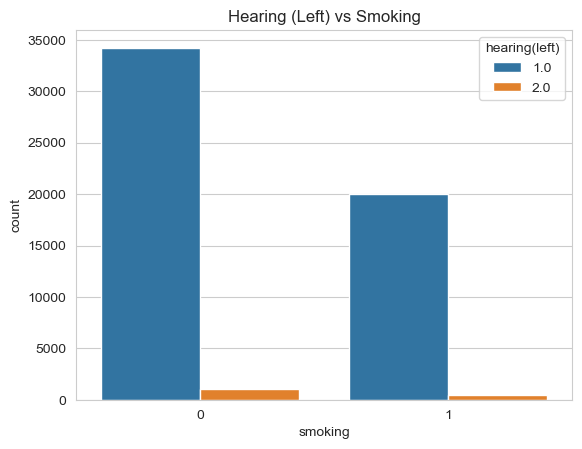

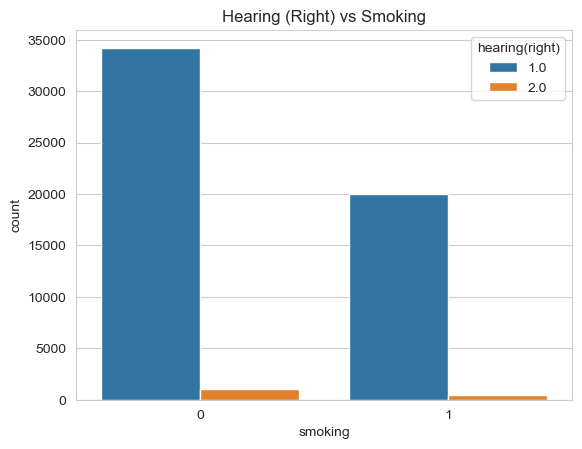

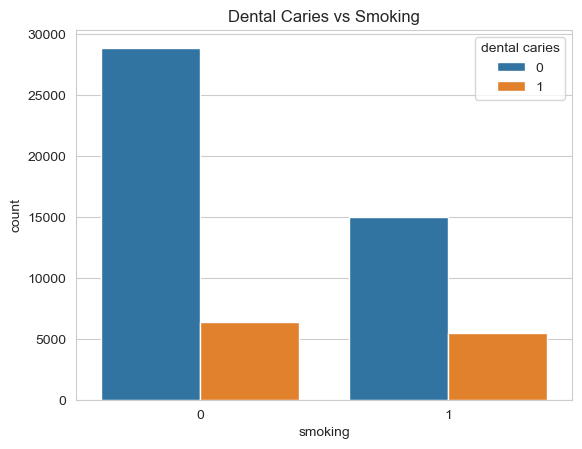

In [45]:
# Convert hearing and dental caries to categorical
df['hearing(left)'] = pd.Categorical(df['hearing(left)'])
df['hearing(right)'] = pd.Categorical(df['hearing(right)'])
df['dental caries'] = pd.Categorical(df['dental caries'])

# Create count plots for smoking vs categorical features
plt.figure()
sns.countplot(x='smoking', hue='gender', data=df)
plt.title('Gender vs Smoking')

plt.figure()
sns.countplot(x='smoking', hue='tartar', data=df)
plt.title('Tartar vs Smoking')

plt.figure()
sns.countplot(x='smoking', hue='hearing(left)', data=df)
plt.title('Hearing (Left) vs Smoking')

plt.figure()
sns.countplot(x='smoking', hue='hearing(right)', data=df)
plt.title('Hearing (Right) vs Smoking')

plt.figure()
sns.countplot(x='smoking', hue='dental caries', data=df)
plt.title('Dental Caries vs Smoking')

The count plots generated from the code suggest that the number of female smokers is significantly lower than males. Smokers have a higher prevalence of tartar than non-smokers. Smoking does not appear to have a significant impact on hearing (left and right). However, smoking is associated with a higher prevalence of dental caries.

Checking Change of Data Type 

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55692 entries, 0 to 55691
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   gender               55692 non-null  object  
 1   age                  55692 non-null  int64   
 2   height(cm)           55692 non-null  int64   
 3   weight(kg)           55692 non-null  int64   
 4   waist(cm)            55692 non-null  float64 
 5   eyesight(left)       55692 non-null  float64 
 6   eyesight(right)      55692 non-null  float64 
 7   hearing(left)        55692 non-null  category
 8   hearing(right)       55692 non-null  category
 9   systolic             55692 non-null  float64 
 10  relaxation           55692 non-null  float64 
 11  fasting blood sugar  55692 non-null  float64 
 12  Cholesterol          55692 non-null  float64 
 13  triglyceride         55692 non-null  float64 
 14  HDL                  55692 non-null  float64 
 15  LDL                

In [47]:
df.head().T

,0,1,2,3,4
gender,F,F,M,M,F
age,40,40,55,40,40
height(cm),155,160,170,165,155
weight(kg),60,60,60,70,60
waist(cm),81.3,81.0,80.0,88.0,86.0
eyesight(left),1.2,0.8,0.8,1.5,1.0
eyesight(right),1.0,0.6,0.8,1.5,1.0
hearing(left),1.0,1.0,1.0,1.0,1.0
hearing(right),1.0,1.0,1.0,1.0,1.0
systolic,114.0,119.0,138.0,100.0,120.0


### **4. Build & Train Logistic Regression model (sklearn)**


*   Split the dataset into test and training sets (X_train, X_test, y_train, y_test)
*   Initiate the logistic regression model
*   Start training (you may also adjust parameters)




In [48]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
# please do add other packages in need
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer


In [49]:

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df.drop('smoking', axis=1), 
                                                    df['smoking'], 
                                                    test_size=0.2, 
                                                    random_state=42)

# Preprocess numerical features using StandardScaler
numerical_cols = ['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 
                  'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 
                  'LDL', 'hemoglobin', 'serum creatinine', 'AST', 'ALT', 'Gtp']
numerical_transformer = StandardScaler()
X_train_numerical = numerical_transformer.fit_transform(X_train[numerical_cols])
X_test_numerical = numerical_transformer.transform(X_test[numerical_cols])

# Preprocess categorical features using OneHotEncoder
categorical_cols = ['hearing(left)', 'hearing(right)', 'dental caries', 'gender', 'tartar']
categorical_transformer = OneHotEncoder(handle_unknown='ignore')
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)],
    remainder='passthrough')
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Concatenate scaled numerical features and one-hot encoded categorical features
X_train_concat = np.concatenate((X_train_numerical, X_train_preprocessed), axis=1)
X_test_concat = np.concatenate((X_test_numerical, X_test_preprocessed), axis=1)

# Train a logistic regression model
clf = LogisticRegression(random_state=42, max_iter = 1000000)
clf.fit(X_train_concat, y_train)


LogisticRegression(max_iter=1000000, random_state=42)

### **5. Evaluate the LR model with the test dataset**

- Classification report

In [50]:
from sklearn.metrics import classification_report

# Test the logistic regression model
y_pred = clf.predict(X_test_concat)

# Evaluate the logistic regression model
print(classification_report(y_test, y_pred))






              precision    recall  f1-score   support

           0       0.81      0.77      0.79      7027
           1       0.64      0.69      0.66      4112

    accuracy                           0.74     11139
   macro avg       0.72      0.73      0.73     11139
weighted avg       0.75      0.74      0.74     11139



In [51]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-Score: {:.2f}".format(f1))

# Calculate confusion matrix
confusion_mat = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", confusion_mat)


Accuracy: 0.74
Precision: 0.64
Recall: 0.69
F1-Score: 0.66
Confusion Matrix:
 [[5418 1609]
 [1279 2833]]


### **6. Visualize the classification results**

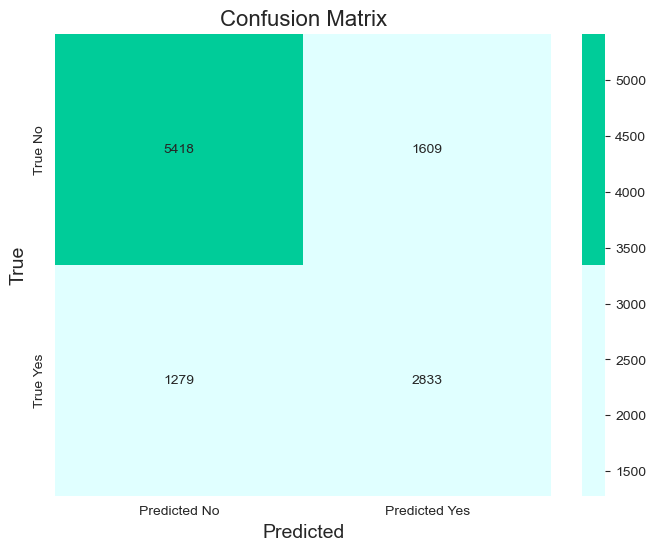

In [52]:
from matplotlib.colors import ListedColormap

# Define custom color map
cmap = ListedColormap(['#e0ffff', '#00cc99'])

# Visualize confusion matrix with custom color map
plt.figure(figsize=(8,6))
sns.heatmap(confusion_mat, annot=True, cmap=cmap, fmt='g', 
            xticklabels=['Predicted No', 'Predicted Yes'], 
            yticklabels=['True No', 'True Yes'])
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('True', fontsize=14)
plt.title('Confusion Matrix', fontsize=16)
plt.show()


## Feature Selection

 #### L1 regularization (Lasso)

In [53]:
df_l1 = pd.read_csv('/content/smoking.csv')
df_l1.head()

,ID,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,...,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,...,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,...,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,...,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,...,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0


In [54]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# create a list of numerical and categorical columns
numerical_cols = ['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 
                  'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 
                  'LDL', 'hemoglobin', 'serum creatinine', 'AST', 'ALT', 'Gtp']
categorical_cols = ['hearing(left)', 'hearing(right)', 'dental caries', 'gender', 'tartar']

# create a list of all feature columns
feature_cols = numerical_cols + categorical_cols

# create a new dataframe with only feature and target columns
df_l1 = df_l1[feature_cols + ['smoking']]

# convert categorical columns to numerical using one-hot encoding
df_l1 = pd.get_dummies(df_l1, columns=categorical_cols)

# separate features and target variable
X = df_l1.drop('smoking', axis=1)
y = df_l1['smoking']

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# create a logistic regression model with L1 regularization
logreg = LogisticRegression(penalty='l1', solver='liblinear', random_state=42)

# fit the model to the training data
logreg.fit(X_train, y_train)

# predict on the testing data
y_pred = logreg.predict(X_test)

# calculate the accuracy score of the model
accuracy = accuracy_score(y_test, y_pred)

# print the accuracy score
print("Accuracy:", accuracy)


Accuracy: 0.7418978364305593


Confusion Matrix:
 [[5422 1605]
 [1270 2842]]
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.77      0.79      7027
           1       0.64      0.69      0.66      4112

    accuracy                           0.74     11139
   macro avg       0.72      0.73      0.73     11139
weighted avg       0.75      0.74      0.74     11139



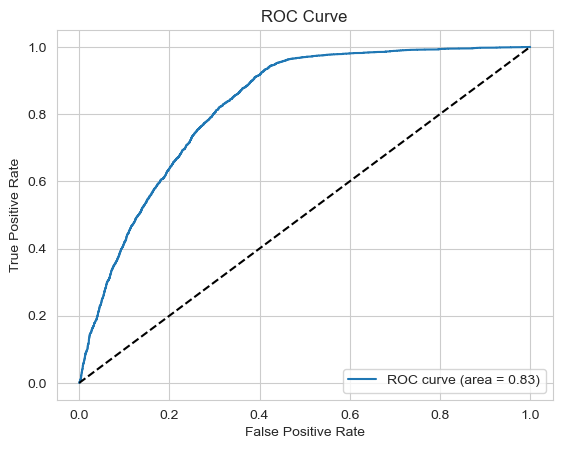

In [55]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score

# calculate predictions
y_pred = logreg.predict(X_test)

# calculate probabilities
y_prob = logreg.predict_proba(X_test)[:,1]

# calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)

# calculate classification report
cr = classification_report(y_test, y_pred)
print("Classification Report:\n", cr)

# calculate ROC curve and AUC score
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
auc_score = roc_auc_score(y_test, y_prob)

# plot ROC curve
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()


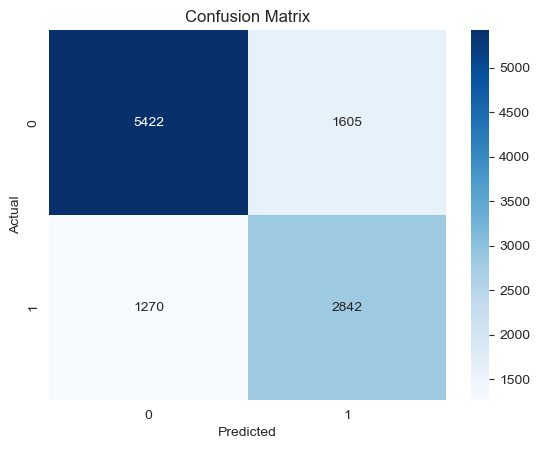

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns

# calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# plot the confusion matrix
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

 #### Recursive Feature Elimination

In [57]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

# load the dataset
df_step = pd.read_csv('/content/smoking.csv')
df_step = df_step.drop(['ID', 'oral'], axis=1)

# apply one-hot encoding to categorical columns
df_step = pd.get_dummies(df_step)

# separate features and target variable
X = df_step.drop('smoking', axis=1)
y = df_step['smoking']

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=95)

# create a logistic regression model
logreg = LogisticRegression(max_iter= 5000)

# create the RFE object and set the desired number of features to select
rfe = RFE(estimator=logreg, n_features_to_select=10, step=1)

# fit the RFE object to the training data
rfe.fit(X_train, y_train)

# print the selected features
selected_features = X_train.columns[rfe.support_]
print('Selected features:', selected_features)

# select the selected features in the training and testing data
X_train_sel = X_train[selected_features]
X_test_sel = X_test[selected_features]

# fit the logistic regression model to the training data with the selected features
logreg.fit(X_train_sel, y_train)

# predict the testing data with the selected features
y_pred = logreg.predict(X_test_sel)

# calculate and print the confusion matrix and classification report
cm = confusion_matrix(y_test, y_pred)
print('Confusion matrix:\n', cm)
print('Classification report:\n', classification_report(y_test, y_pred))


Selected features: Index(['eyesight(left)', 'hearing(left)', 'hemoglobin', 'Urine protein',
       'serum creatinine', 'dental caries', 'gender_F', 'gender_M', 'tartar_N',
       'tartar_Y'],
      dtype='object')
Confusion matrix:
 [[4942 2103]
 [ 945 3149]]
Classification report:
               precision    recall  f1-score   support

           0       0.84      0.70      0.76      7045
           1       0.60      0.77      0.67      4094

    accuracy                           0.73     11139
   macro avg       0.72      0.74      0.72     11139
weighted avg       0.75      0.73      0.73     11139



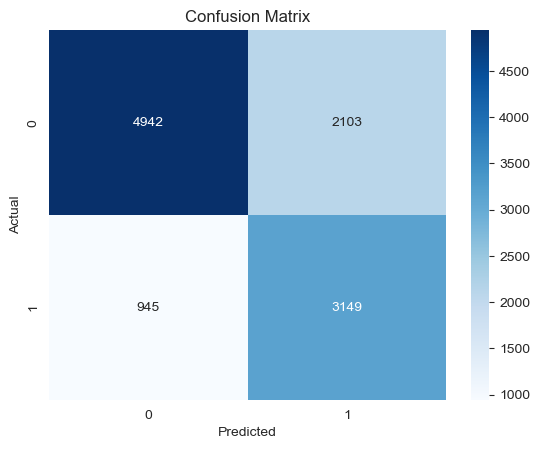

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

# calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# plot the confusion matrix
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


#### SHAP Values

In [59]:
df_shap = pd.read_csv('/content/smoking.csv')
df_shap = df_shap.drop(['ID', 'oral'], axis=1)
df_shap

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,tartar,smoking
0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,114.0,...,126.0,12.9,1.0,0.7,18.0,19.0,27.0,0,Y,0
1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,119.0,...,127.0,12.7,1.0,0.6,22.0,19.0,18.0,0,Y,0
2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,138.0,...,151.0,15.8,1.0,1.0,21.0,16.0,22.0,0,N,1
3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,100.0,...,226.0,14.7,1.0,1.0,19.0,26.0,18.0,0,Y,0
4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,120.0,...,107.0,12.5,1.0,0.6,16.0,14.0,22.0,0,N,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55687,F,40,170,65,75.0,0.9,0.9,1.0,1.0,110.0,...,118.0,12.3,1.0,0.6,14.0,7.0,10.0,1,Y,0
55688,F,45,160,50,70.0,1.2,1.2,1.0,1.0,101.0,...,79.0,14.0,1.0,0.9,20.0,12.0,14.0,0,Y,0
55689,F,55,160,50,68.5,1.0,1.2,1.0,1.0,117.0,...,63.0,12.4,1.0,0.5,17.0,11.0,12.0,0,N,0
55690,M,60,165,60,78.0,0.8,1.0,1.0,1.0,133.0,...,146.0,14.4,1.0,0.7,20.0,19.0,18.0,0,N,0


In [60]:
import shap

# load JS visualization code to notebook
shap.initjs()

Permutation explainer: 11140it [03:26, 51.70it/s]                           
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


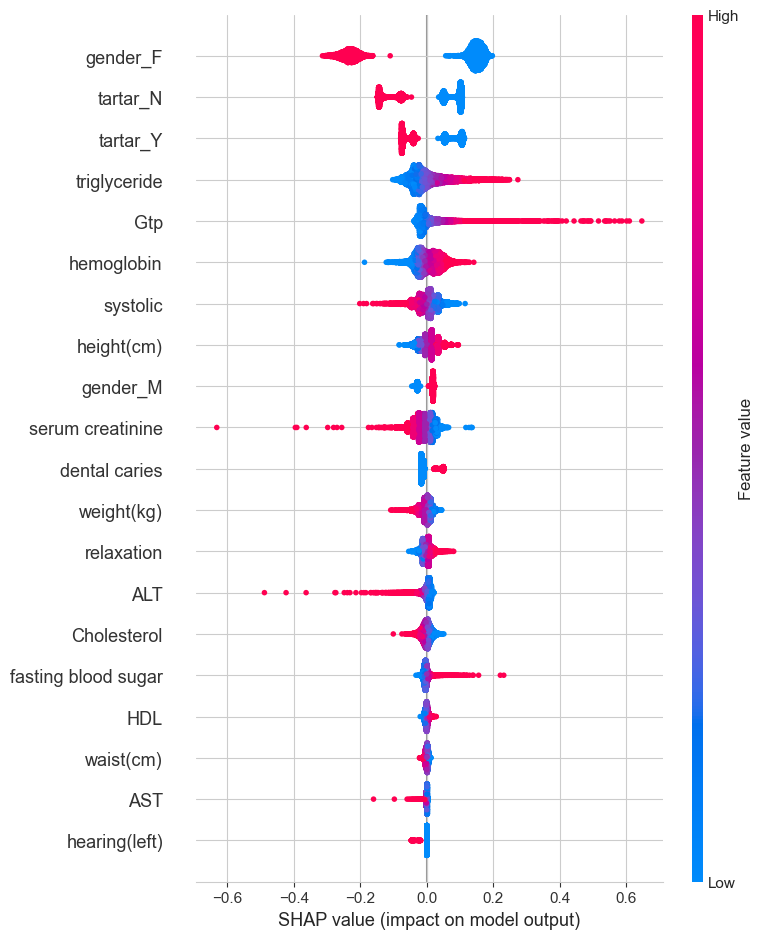

In [61]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split


# one-hot encode categorical variables
df_shap = pd.get_dummies(df_shap)

# separate features and target variable
X = df_shap.drop('smoking', axis=1)
y = df_shap['smoking']

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# create a logistic regression model
logreg = LogisticRegression(max_iter= 10000)

# fit the model to the training data
logreg.fit(X_train, y_train)

# calculate SHAP values
explainer = shap.Explainer(logreg.predict_proba, X_train)
shap_values = explainer(X_test)

# plot the SHAP values
shap.summary_plot(shap_values[:, :, 1], X_test)


The SHAP value plot provides a comprehensive visualization of the impact of different features on the model's predictions. In this case, we can see that Gtp, triglyceride and fasting blood sugar have a significantly positive contribution to the model when their values are high. This suggests that higher levels of Gtp and triglyceride are associated with a higher likelihood of smoking.

On the other hand, we can see that high values of ALT, serum creatinine, and systolic variable have a negative impact on the model's predictions. This suggests that higher levels of these variables are associated with a lower likelihood of smoking.

Overall, the SHAP value plot provides us with valuable insights into the variables that are most influential in predicting smoking behavior. By understanding which variables have the most significant impact on the model's predictions, we can make more informed decisions when it comes to developing targeted interventions and public health policies aimed at reducing smoking rates